In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings("ignore")

In [2]:
feature = pd.read_csv('Scaled features and predicted Score1.csv')
feature.head()

,median_household_income_dollars,Percent_Unemployment_Rate,single_chi18_fam_pct,one_working_chi18_fam_pct,retir_income_pct,no_child_one_working_fam_pct,chi18_fam_pct2,Disability_pct,number_total_househlds,score1_all_equal,score2_compo2,score3_compo3,score4_compo4,zipcode
0,1.163242,0.000000,8.456986,2.763671,6.095782,3.790037,3.326491,5.085004,7.438675,4.235543,2.930571,4.279634,4.497973,601
1,1.601844,0.000000,6.442930,3.402690,6.449684,4.449326,3.401086,2.689065,8.445554,4.098020,2.920485,3.622447,4.191171,602
2,1.646862,0.000000,8.403286,2.951210,5.681244,3.236643,3.259292,0.640584,8.962826,3.864661,2.778507,2.961161,3.783294,603
3,1.324514,2.638037,7.063947,3.651919,4.425447,5.772290,3.097743,3.677818,6.037379,4.187677,3.399677,3.937799,4.124686,606
4,1.854241,0.981595,6.206791,3.114467,5.509643,3.984598,3.619255,3.489439,8.017351,4.086375,3.133355,3.864706,4.352915,610


In [3]:
score_cols = feature.columns.str.contains('score')

### Clustering with KMeans

In [4]:

def cluster_ana2(cluster_number, df, seed = 892):
    kmeans = KMeans(n_clusters=cluster_number, random_state=seed)
    kmeans.fit(df)
    ss = df.copy()
    ss['cluster_label'] = kmeans.labels_
    setn_cl = feature.join(ss['cluster_label'])
    return setn_cl


In [5]:
comb = cluster_ana2(20, feature.loc[:,score_cols].dropna())

In [6]:
comb.loc[comb.isnull().any(axis = 1)].shape # missing data due to scarce population

(569, 15)

### Visualization - Score and Cluster overlap

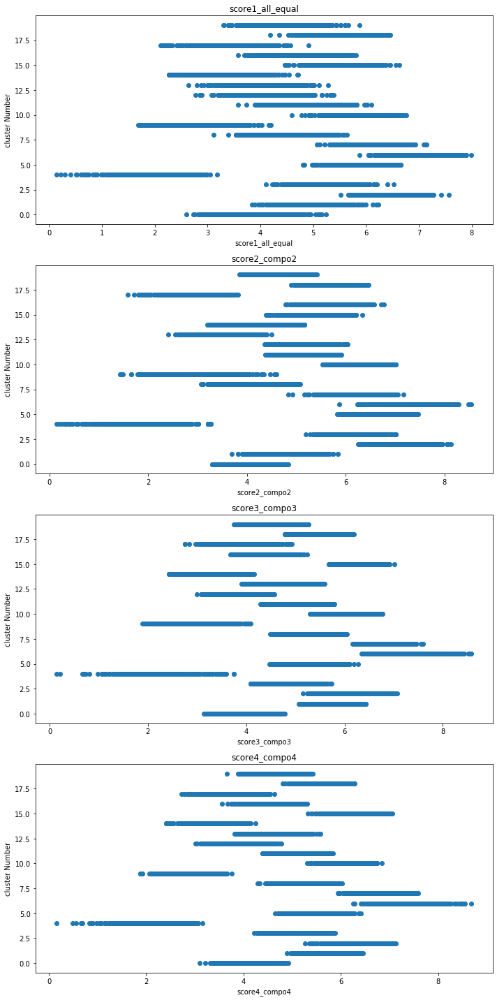

In [7]:
fig, axes = plt.subplots(4, figsize = (10,20))
for i,col in enumerate(['score1_all_equal', 'score2_compo2', 'score3_compo3', 'score4_compo4']):
    axes[i].scatter(x = col, y = 'cluster_label', data = comb)
    axes[i].set_title(col)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('cluster Number')
plt.tight_layout()

### Geographical Visualization - plotly

In [8]:
import chart_studio.plotly as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
import chart_studio.plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

###### Combine with latitude, longitude data

In [9]:
geo = pd.read_csv('US Zip Codes from 2013 Government Data.txt', sep = ',')

In [10]:
geo.head()

,ZIP,LAT,LNG
0,601,18.180555,-66.749961
1,602,18.361945,-67.175597
2,603,18.455183,-67.119887
3,606,18.158345,-66.932911
4,610,18.295366,-67.125135


In [11]:
df = comb.fillna(0)

In [12]:
def addLonLat2Zip(org_df, ref_df):
    #lon = pd.DataFrame({'lon': []})
    lon = pd.DataFrame(columns=['lon'])
    #lat = pd.DataFrame({'lat': []})
    lat = pd.DataFrame(columns=['lat'])
    for i in range(org_df.shape[0]):
        if i%1000 == 0:
            print(i)
        lon_val = ref_df[ref_df['ZIP'] == org_df.iloc[i, 13]]['LNG'].iloc[0]
        #print(lon_val)
        lat_val = ref_df[ref_df['ZIP'] == org_df.iloc[i, 13]]['LAT'].iloc[0]
        #print(lat_val)
        
        lon = lon.append({'lon': lon_val}, ignore_index=True)
        lat = lat.append({'lat': lat_val}, ignore_index=True)
    #print(lon)
    #print(lat)
    org_df = org_df.join(lon)
    org_df = org_df.join(lat)
    return org_df

In [13]:
new_df = addLonLat2Zip(df, geo)

0
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000
25000
26000
27000
28000
29000
30000
31000
32000


In [14]:
# new_df.to_csv('cluster_latlon.csv')
new_df.head()

,median_household_income_dollars,Percent_Unemployment_Rate,single_chi18_fam_pct,one_working_chi18_fam_pct,retir_income_pct,no_child_one_working_fam_pct,chi18_fam_pct2,Disability_pct,number_total_househlds,score1_all_equal,score2_compo2,score3_compo3,score4_compo4,zipcode,cluster_label,lon,lat
0,1.163242,0.000000,8.456986,2.763671,6.095782,3.790037,3.326491,5.085004,7.438675,4.235543,2.930571,4.279634,4.497973,601,13.0,-66.749961,18.180555
1,1.601844,0.000000,6.442930,3.402690,6.449684,4.449326,3.401086,2.689065,8.445554,4.098020,2.920485,3.622447,4.191171,602,17.0,-67.175597,18.361945
2,1.646862,0.000000,8.403286,2.951210,5.681244,3.236643,3.259292,0.640584,8.962826,3.864661,2.778507,2.961161,3.783294,603,17.0,-67.119887,18.455183
3,1.324514,2.638037,7.063947,3.651919,4.425447,5.772290,3.097743,3.677818,6.037379,4.187677,3.399677,3.937799,4.124686,606,0.0,-66.932911,18.158345
4,1.854241,0.981595,6.206791,3.114467,5.509643,3.984598,3.619255,3.489439,8.017351,4.086375,3.133355,3.864706,4.352915,610,17.0,-67.125135,18.295366


##### Plot score (color scaled)

In [15]:
# df_compo4

df_compo4 = new_df.sort_values(by=['score4_compo4'])
#scl = [0,"rgb(150,0,90)"],[0.125,"rgb(0, 0, 200)"],[0.25,"rgb(0, 25, 255)"],\
#[0.375,"rgb(0, 152, 255)"],[0.5,"rgb(44, 255, 150)"],[0.625,"rgb(151, 255, 0)"],\
#[0.75,"rgb(255, 234, 0)"],[0.875,"rgb(255, 111, 0)"],[1,"rgb(255, 0, 0)"]

#scl = [0,"rgb(0, 255, 0)"],[0.5,"rgb(255, 255, 0)"], [1,"rgb(255, 0, 0)"]
scl = [0,"rgb(255, 0, 0)"],[0.5,"rgb(255, 255, 0)"], [1,"rgb(0, 255, 0)"]
#scl = [0,"rgb(255, 0, 0)"],[0.5,"rgb(0, 0, 128)"], [1,"rgb(0, 0, 255)"]


data = [go.Scattergeo(
    lat = df_compo4['lat'],
    lon = df_compo4['lon'],
    #text = df['Globvalue'].astype(str) + ' inches',
    marker = dict(
        color = df_compo4['score4_compo4'],
        colorscale = scl,
        reversescale = True,
        opacity = 0.7,
        size = 2,        
        colorbar = dict(
            thickness = 20,
            titleside = "right",
            outlinecolor = "rgba(68, 68, 68, 0)",
            ticks = "outside",
            ticklen = 3,
            showticksuffix = "last",
            ticksuffix = " score",
            dtick = 0.5
        )                
    )
)]

layout = dict(
    geo = dict(
        scope = 'north america',
        showland = True,
        landcolor = "rgb(212, 212, 212)",
        subunitcolor = "rgb(255, 255, 255)",
        countrycolor = "rgb(255, 255, 255)",
        showlakes = True,
        lakecolor = "rgb(255, 255, 255)",
        showsubunits = True,
        showcountries = True,
        resolution = 50,
        projection = dict(
            type = 'conic conformal',
            rotation = dict(
                lon = -100
            )
        ),
        lonaxis = dict(
            showgrid = True,
            gridwidth = 0.5,
            range= [ -140.0, -55.0 ],
            dtick = 5
        ),
        lataxis = dict (
            showgrid = True,
            gridwidth = 0.5,
            range= [ 20.0, 60.0 ],
            dtick = 5
        )
    ),
    title = 'USA Life Insurance Score by ZIP Code (compo4)',
)

fig = go.Figure(data=data, layout=layout )

iplot(fig)


#### Plot by cluster labels

In [22]:

# cluster layout
fign = dict()

for i in range(20):
    
    df_cluster = new_df[new_df['cluster_label'] == i]
    #scl = [0,"rgb(150,0,90)"],[0.125,"rgb(0, 0, 200)"],[0.25,"rgb(0, 25, 255)"],\
    #[0.375,"rgb(0, 152, 255)"],[0.5,"rgb(44, 255, 150)"],[0.625,"rgb(151, 255, 0)"],\
    #[0.75,"rgb(255, 234, 0)"],[0.875,"rgb(255, 111, 0)"],[1,"rgb(255, 0, 0)"]

    scl = [0,"rgb(255, 0, 0)"],[0.5,"rgb(255, 0, 0)"], [1,"rgb(255, 0, 0)"]
    #scl = [0,"rgb(255, 0, 0)"]

    data = [go.Scattergeo(
        lat = df_cluster['lat'],
        lon = df_cluster['lon'],
        #text = df['Globvalue'].astype(str) + ' inches',
        marker = dict(
            color = df_cluster['cluster_label'],
            colorscale = scl,
            reversescale = True,
            opacity = 0.7,
            size = 2,        
            colorbar = dict(
                thickness = 20,
                titleside = "right",
                outlinecolor = "rgba(68, 68, 68, 0)",
                ticks = "outside",
                ticklen = 1,
                showticksuffix = "last",
                ticksuffix = " cluster No.",
                dtick = 1
            )                
        )
    )]

    layout = dict(
        geo = dict(
            scope = 'north america',
            showland = True,
            landcolor = "rgb(212, 212, 212)",
            subunitcolor = "rgb(255, 255, 255)",
            countrycolor = "rgb(255, 255, 255)",
            showlakes = True,
            lakecolor = "rgb(255, 255, 255)",
            showsubunits = True,
            showcountries = True,
            resolution = 50,
            projection = dict(
                type = 'conic conformal',
                rotation = dict(
                    lon = -100
                )
            ),
            lonaxis = dict(
                showgrid = True,
                gridwidth = 0.5,
                range= [ -140.0, -55.0 ],
                dtick = 5
            ),
            lataxis = dict (
                showgrid = True,
                gridwidth = 0.5,
                range= [ 20.0, 60.0 ],
                dtick = 5
            )
        ),
        title = 'USA Life Insurance Cluster Number '+str(i)+ ' by ZIP Code',
    )

    fign[i] = go.Figure(data=data, layout=layout )
    iplot(fign[i])


##### High-score regions well represented by cluster 6,7 

In [50]:
iplot(fig)
iplot(fign[6])
iplot(fign[7])

In [ ]:
import os

if not os.path.exists("images"):
    os.mkdir("images")

In [24]:
fig.write_image("images/score.png")

In [23]:
for k in range(20):
    fign[k].write_image("images/cluster"+str(k)+".png")
# fig.write_image("images/fig1.svg")